## [fish](https://www.kaggle.com/crowww/a-large-scale-fish-dataset)

In [1]:
import os
import random
import numpy as np
import torch
import torchvision

In [2]:
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [3]:
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(42)

In [4]:
!kaggle datasets download -d crowww/a-large-scale-fish-dataset

Dataset URL: https://www.kaggle.com/datasets/crowww/a-large-scale-fish-dataset
License(s): Attribution 4.0 International (CC BY 4.0)
100%|█████████████████████████████████████▉| 3.24G/3.24G [02:24<00:00, 26.7MB/s]
100%|██████████████████████████████████████| 3.24G/3.24G [02:24<00:00, 24.2MB/s]


In [5]:
!unzip a-large-scale-fish-dataset.zip

Archive:  a-large-scale-fish-dataset.zip
  inflating: Fish_Dataset/Fish_Dataset/Black Sea Sprat/Black Sea Sprat GT/00001.png  
  inflating: Fish_Dataset/Fish_Dataset/Black Sea Sprat/Black Sea Sprat GT/00002.png  
  inflating: Fish_Dataset/Fish_Dataset/Black Sea Sprat/Black Sea Sprat GT/00003.png  
  inflating: Fish_Dataset/Fish_Dataset/Black Sea Sprat/Black Sea Sprat GT/00004.png  
  inflating: Fish_Dataset/Fish_Dataset/Black Sea Sprat/Black Sea Sprat GT/00005.png  
  inflating: Fish_Dataset/Fish_Dataset/Black Sea Sprat/Black Sea Sprat GT/00006.png  
  inflating: Fish_Dataset/Fish_Dataset/Black Sea Sprat/Black Sea Sprat GT/00007.png  
  inflating: Fish_Dataset/Fish_Dataset/Black Sea Sprat/Black Sea Sprat GT/00008.png  
  inflating: Fish_Dataset/Fish_Dataset/Black Sea Sprat/Black Sea Sprat GT/00009.png  
  inflating: Fish_Dataset/Fish_Dataset/Black Sea Sprat/Black Sea Sprat GT/00010.png  
  inflating: Fish_Dataset/Fish_Dataset/Black Sea Sprat/Black Sea Sprat GT/00011.png  
  inflating: 

In [6]:
base_dir = '.'

In [7]:
data_dir = base_dir + '/NA_Fish_Dataset'

classes = os.listdir(data_dir)
print(classes)

['Red Mullet', 'Black Sea Sprat', 'Sea Bass', 'Striped Red Mullet', 'Horse Mackerel', 'Trout', 'Gilt Head Bream', 'Red Sea Bream', 'Shrimp']


## [ImageFolder](https://pytorch.org/docs/stable/torchvision/datasets.html#imagefolder)

In [8]:
dataset = torchvision.datasets.ImageFolder(data_dir)

In [9]:
print(type(dataset))

# tuple: (image, target)

<class 'torchvision.datasets.folder.ImageFolder'>


In [10]:
print(len(dataset))

430


In [11]:
n = 200
data, target = dataset[n]

In [12]:
print(type(data))

<class 'PIL.Image.Image'>


In [13]:
print(data.mode, data.width, data.height)

RGB 2832 2128


In [14]:
print(type(target))

<class 'int'>


In [15]:
print(set(dataset.targets))

{0, 1, 2, 3, 4, 5, 6, 7, 8}


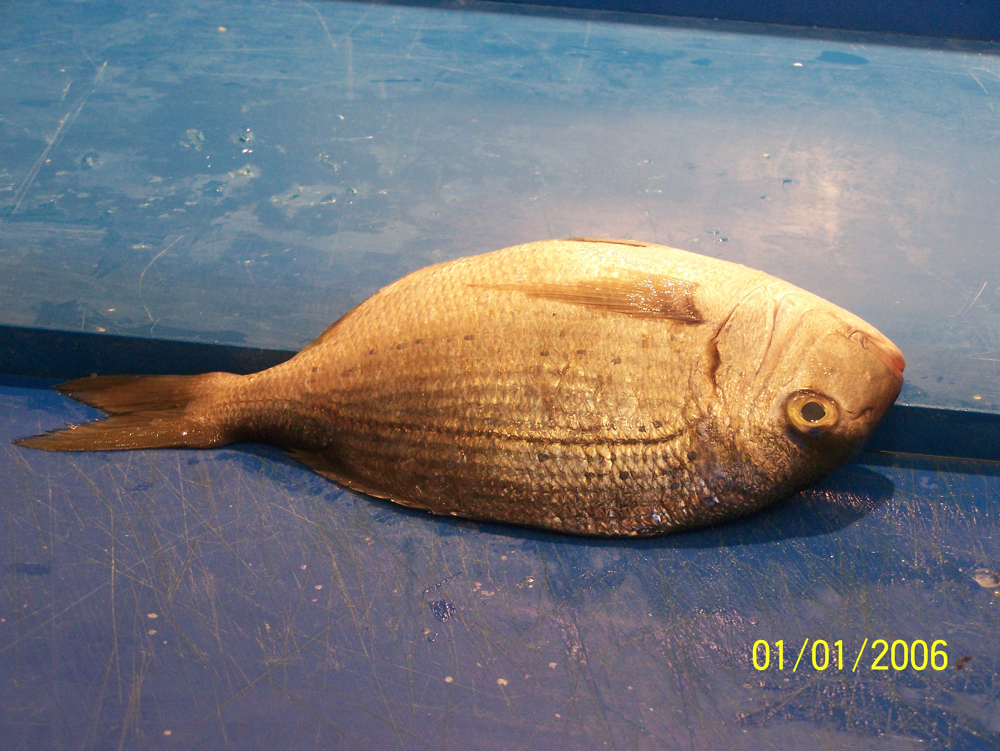

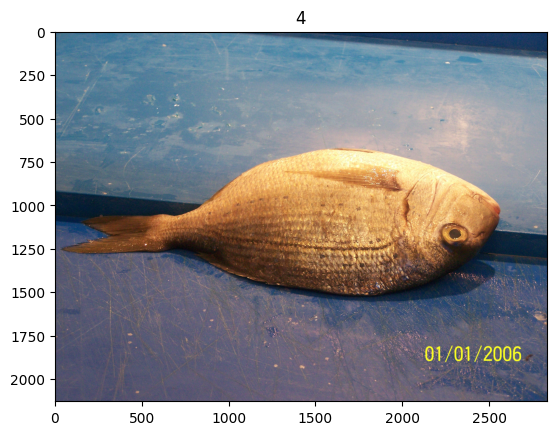

In [16]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.title(target)
plt.imshow(data)
data.show()

In [17]:
import torchvision.transforms as transforms
# batch must contain tensors, numpy arrays, numbers, dicts or lists
compose = transforms.Compose([
    transforms.Resize(255),
    transforms.CenterCrop(224),
    transforms.ToTensor()
])
dataset = torchvision.datasets.ImageFolder(data_dir, transform=compose)

In [18]:
data_loader = torch.utils.data.DataLoader(dataset,
                                          batch_size=1,
                                          shuffle=True)

torch.Size([1, 3, 224, 224])
torch.Size([3, 224, 224])


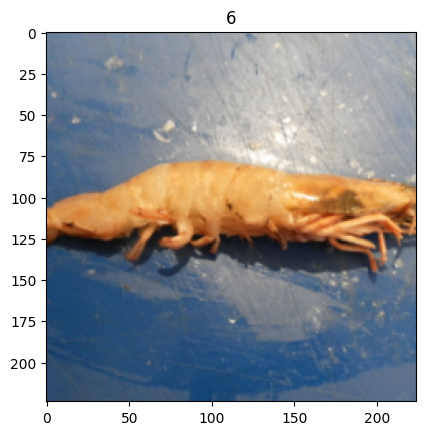

In [19]:
ToPILImage = transforms.Compose([
    transforms.ToPILImage()
])

for data, target in data_loader:
    print(data.shape)
    data = data.squeeze() # 불필요한 차원 하나를 줄인다(batch_size=1)
    print(data.shape)
    pic = ToPILImage(data)
    plt.title(int(target))
    plt.imshow(pic)
    plt.show()
    break

In [20]:
data_loader = torch.utils.data.DataLoader(dataset,
                                          batch_size=10,
                                          shuffle=True)

torch.Size([10, 3, 224, 224])
torch.Size([3, 224, 224])


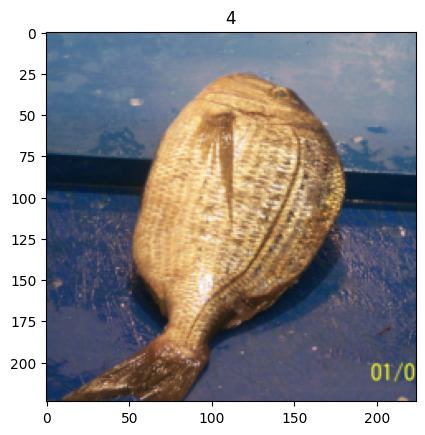

In [21]:
ToPILImage = transforms.Compose([
    transforms.ToPILImage()
])

for data, target in data_loader:
    index = 5
    print(data.shape)
    img = data[index]
    print(img.shape)
    pic = ToPILImage(img)
    plt.title(int(target[index]))
    plt.imshow(pic)
    plt.show()
    break

In [22]:
%matplotlib inline

import numpy as np

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.utils as utils
import torchvision.transforms as transforms

is_cuda = torch.cuda.is_available()
device = torch.device('cuda' if is_cuda else 'cpu')

In [23]:
import torchvision.transforms as transforms
compose_train = transforms.Compose([
                      transforms.Resize(255),
                      transforms.CenterCrop(224),
                      transforms.RandomHorizontalFlip(),
                      transforms.RandomRotation(10),
                      transforms.RandomAffine(0, shear=10, scale=(0.8, 1.2)),
                      transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
                      transforms.ToTensor(),
                      transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
                      ])
compose_test = transforms.Compose([
    transforms.Resize(255),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
])

dataset = torchvision.datasets.ImageFolder(data_dir)
train_data, test_data = torch.utils.data.random_split(dataset, [344, 86])

In [24]:
train_data.dataset.transform = compose_train
test_data.dataset.transform = compose_test

In [25]:
print('train sets: {}'.format(len(train_data)))
print('test sets: {}'.format(len(test_data)))

train sets: 344
test sets: 86


In [26]:
BATCH_SIZE = 10

train_loader = torch.utils.data.DataLoader(train_data,
                                          batch_size=BATCH_SIZE,
                                          shuffle=True)
test_loader = torch.utils.data.DataLoader(test_data,
                                          batch_size=BATCH_SIZE,
                                          shuffle=True)

In [27]:
import torchvision.models as models

model = models.resnet18(pretrained=True)
for param in model.parameters():
    param.requires_grad = False

model.l1 = nn.Linear(512, 256)
model.l2 = nn.Linear(256, 128)
model.l3 = nn.Linear(128, 9)

nn.init.kaiming_normal_(model.l1.weight)
nn.init.kaiming_normal_(model.l2.weight)
nn.init.kaiming_normal_(model.l3.weight)

model.fc = nn.Sequential(nn.BatchNorm1d(512),
                         nn.Dropout(0.5),
                         model.l1,
                         nn.BatchNorm1d(256),
                         nn.Dropout(0.5),
                         model.l2,
                         nn.BatchNorm1d(128),
                         nn.Dropout(0.5),
                         model.l3,
                         nn.BatchNorm1d(9),
                         nn.Dropout(0.5)
                      )
model = model.to(device)

/home/ubuntu/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/ubuntu/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [28]:
n = 0
for data, target in train_loader:
    print(data.shape) # (batch, channel, width, height)
    break

data = data.to(device)

with torch.no_grad():
    y = model(data)
    print(y)
    print(np.argmax(y.cpu(), axis=1), target)

torch.Size([10, 3, 224, 224])
tensor([[ 0.0000,  0.0000, -2.1353, -0.0000, -0.4292, -0.0000, -0.2781, -0.0000,
          2.3354],
        [-0.0000, -0.0000,  1.8487, -0.0000,  1.6214,  0.0000, -3.6883, -0.0000,
         -0.8399],
        [-0.1518,  2.3154,  0.0000,  0.0000, -2.1760, -0.0000,  0.0000, -3.0676,
          2.6155],
        [-0.0000, -0.9136, -2.1516, -0.0000,  1.9803, -2.0645, -0.0000,  0.0000,
          0.8231],
        [ 2.9161, -0.0000,  0.0000,  0.0000,  0.0000, -0.0000, -0.2595,  0.8496,
         -0.0000],
        [ 2.7591,  2.3424, -0.0000,  1.9843,  3.0721,  1.7260,  0.1601,  0.0000,
          1.8351],
        [-2.1049, -0.0000, -0.0000, -0.5795, -1.3441,  1.8996,  1.4291,  0.0000,
         -3.4145],
        [-1.6004,  1.2777,  4.2523, -2.2172, -0.0000,  0.0000,  0.0000,  0.4423,
         -1.5031],
        [ 0.0000,  1.5504,  1.0436,  0.0000,  0.0814, -3.4479,  3.4063,  0.0000,
          1.2885],
        [-0.0000,  0.0000, -1.8982, -0.7920, -0.0000,  0.0000, -0.0000

In [29]:
BATCH_SIZE = 100

train_loader = torch.utils.data.DataLoader(train_data,
                                          batch_size=BATCH_SIZE,
                                          shuffle=True)
test_loader = torch.utils.data.DataLoader(test_data,
                                          batch_size=BATCH_SIZE,
                                          shuffle=True)

In [30]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss().to(device)

n_epochs = 6 # 6회 학습

list_training_loss = []
list_test_loss = []
batch_length = int(len(train_data) / BATCH_SIZE)

for epoch in range(n_epochs):
    n_train = 0
    train_loss = 0
    model.train()
    for train_data, train_target in train_loader:
        train_data = train_data.to(device)
        train_target = train_target.to(device)
        y = model(train_data)
        del train_data
        loss = criterion(y, train_target).sum()
        train_loss += loss.data.cpu().numpy()
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        n_train += 1
        del train_target
        if( n_train % 5 == 0 ):
          print('epoch {}th: {}/{} loss - {}'.format(epoch, n_train, batch_length, loss.data.cpu().numpy().sum()))


    model.eval()
    n_test = 0
    test_loss = 0
    correct = 0
    total = 0
    for test_data, test_target in test_loader:
        test_data = test_data.to(device)
        test_target = test_target.to(device)
        y_pred = model(test_data)
        idx_pred = torch.max(y_pred, 1)[1]
        del test_data
        loss = criterion(y_pred, test_target).sum()
        test_loss += loss.data.cpu().numpy()
        n_test += 1
        total += len(test_target)
        correct += (idx_pred == test_target).sum()

    accuracy = correct * 100 / total
    print('epoch {}th training loss: {} test loss: {}, accuracy: {}'.format(
            epoch + 1, train_loss / n_train, test_loss / n_test,
            accuracy
        ))
    list_training_loss.append(train_loss / n_train)
    list_test_loss.append(test_loss / n_test)

epoch 1th training loss: 2.8090914487838745 test loss: 2.019096612930298, accuracy: 32.55813980102539
epoch 2th training loss: 2.377427875995636 test loss: 1.5383926630020142, accuracy: 52.32558059692383
epoch 3th training loss: 2.116118371486664 test loss: 1.2832727432250977, accuracy: 72.09302520751953
epoch 4th training loss: 2.018451899290085 test loss: 1.1170836687088013, accuracy: 83.72093200683594
epoch 5th training loss: 1.7318611443042755 test loss: 1.0109764337539673, accuracy: 88.3720932006836
epoch 6th training loss: 1.6775479912757874 test loss: 0.9572651982307434, accuracy: 90.69767761230469


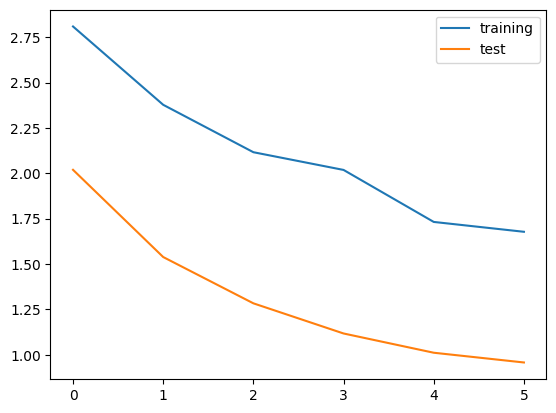

In [31]:
import matplotlib.pyplot as plt

plt.plot(list_training_loss, label='training')
plt.plot(list_test_loss, label='test')
plt.legend()
plt.show()